In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np
from skimage.metrics import structural_similarity, peak_signal_noise_ratio
import matplotlib.pylab as plt
import matplotlib.colors as colors
import matplotlib.patches as patches
from torch.utils.data import DataLoader,ConcatDataset, TensorDataset
import torchvision
import matplotlib.patches as patches
import torchvision.transforms as transforms

import os
import time
import torch
import sys
import argparse
sys.path.insert(0, '../../shared_code')
# from network import *
from model_loader_func import * 
from dataloader_func import resize_image,add_noise_torch, rescale_image_range,int_to_float,rgb_to_gray, patch_generator, single_image_loader,load_dataset,prep_dataset
from quality_metrics_func import *
from linear_approx import *
from inverse_tasks_func import synthesis
from plotting_func import plot_many_denoised,  show_im_set, plot_single_im,plot_matching_patches
from algorithm_inv_prob import * 
from trainer import make_loader
from synthetic_data_generators import *

%matplotlib inline

In [15]:
print(torch.__version__)
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
device

2.5.0+cu124


device(type='cuda')

In [3]:
denoisers = {}


root_path = '/mnt/home/zkadkhodaie/ceph/21_hierarchical_conditional_prior/denoisers/'

paths = { 'mixture-gray':'UNet_flex/ovals_texture/0to255_RF_84x84_set_size_250000_80x80/',           
            'conditional-gray':'UNet_conditional_mean_matching/ovals_texture/0to255_RF_84x84_set_size_250000_80x80/'
        }

groups = paths.keys()

for group in groups: 
    path = root_path + paths[group]

    print('loading group ' , group )
    denoisers[group] = load_learned_model(path, print_args=True)
    start_time_total = time.time()        
    print("--- %s seconds ---" % (round(time.time() - start_time_total)))
      

loading group  mixture-gray
*************** saved arguments:*************
arch_name UNet_flex
lr 0.001
batch_size 512
num_epochs 1000
lr_freq 100
loss_weight False
noise_level_range [0, 255]
quadratic_noise True
rescale False
swap False
set_size 250000
imagenet_subset_ids None
self_cond False
data_name ovals_texture
data_root_path /mnt/home/zkadkhodaie/ceph/datasets/
dir_name /mnt/home/zkadkhodaie/ceph/21_hierarchical_conditional_prior/denoisers/UNet_flex/ovals_texture/0to255_RF_84x84_set_size_250000_80x80
optional_dir_label None
device cuda
debug False
kernel_size 3
padding 1
skip True
num_channels 1
bias True
RF 84
coarse True
num_kernels [16, 32, 64, 128]
num_blocks 3
num_enc_conv [2, 2, 2]
num_mid_conv 3
num_dec_conv [2, 2, 2]
NormType LayerNorm
match_only_mid True
nonlinear_enc True
******************************************************
number of parameters is  627921
train mode: False
--- 0 seconds ---
loading group  conditional-gray
*************** saved arguments:*************


In [4]:
                              
def make_oval_textures_dataset(set_size, aspect_ratios, num=20, 
                              canvas_size=(80, 80), min_area=60, max_area=100, 
                              edge_smoothness=0.1):
    N = int(set_size/len(aspect_ratios))
 
    # train
    all_data_train = []
    for aspect_ratio in aspect_ratios: 
        ovals = []
        for i in range(N):
            im = generate_ovals_texture(aspect_ratio, num, 
                              canvas_size, min_area, max_area, 
                              edge_smoothness )
            ovals.append(im)
        ovals = torch.stack(ovals).unsqueeze(1)
        all_data_train.append(ovals)

    # test
    N = 100
    all_data_test = []
    for aspect_ratio in aspect_ratios: 
        ovals = []    
        for i in range(N):
            im = generate_ovals_texture(aspect_ratio, num, 
                                  canvas_size, min_area, max_area, 
                                  edge_smoothness )
            ovals.append(im)
        ovals = torch.stack(ovals).unsqueeze(1)
        all_data_test.append(ovals)
    
    return all_data_train, all_data_test


In [5]:
train_sets, test_sets = make_oval_textures_dataset(500, [.2,.5, 1, 2, 5])

In [6]:
print('number of images in each class:', train_sets[0].shape)
K = train_sets[0].shape[2]
n_channels = train_sets[0].shape[1]
print('number of classes: ', len(train_sets))

number of images in each class: torch.Size([100, 1, 80, 80])
number of classes:  5


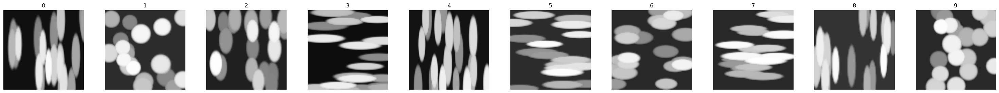

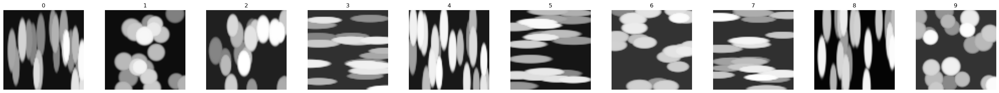

total number of train images: 500


In [7]:
## shuffle train and test images and put them in one tensor 
loader, loader_cond = make_loader(dataset=train_sets, batch_size=512, dataset_cond=train_sets, self_cond =False, )    
train ={}
train['inp']  = loader.dataset
train['cond'] = loader_cond.dataset
show_im_set(train['inp'][0:10], n_columns=10, vmin=0, vmax = 1)
show_im_set(train['cond'][0:10], n_columns=10, vmin=0, vmax = 1)
print('total number of train images:',train['inp'].shape[0])

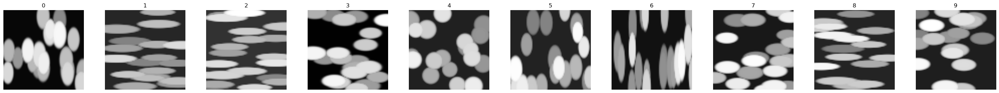

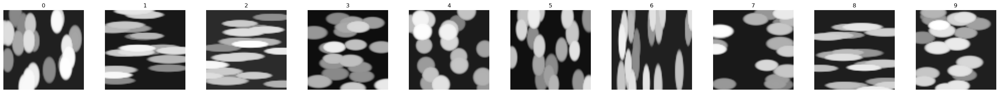

total number of test images: 500


In [8]:
loader, loader_cond = make_loader(dataset=test_sets, batch_size=256, dataset_cond=test_sets, self_cond =False)        
test ={}
test['inp']  = loader.dataset[0:1024]
test['cond'] = loader_cond.dataset[0:1024]
show_im_set(test['inp'][0:10], n_columns=10, vmin=0, vmax = 1)
show_im_set(test['cond'][0:10], n_columns=10, vmin=0, vmax = 1)
print('total number of test images:',test['inp'].shape[0])


tensor(0.4263)


80

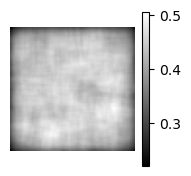

In [9]:
dist_mean = test['inp'].mean(0)
plot_single_im(dist_mean, colorbar=True)
print(dist_mean.mean())
K = dist_mean.shape[2]
K

In [16]:
def get_channel_means(unet, im_cond, device=device, average_phi=False, with_params=True, return_activations = False): 
    '''
    returns means of channels of a UNet_flex operating on noisy
    @noisy: of shape N,C,H,W
    @with_param: important: set to False if phi is computed to be given to the network (instead of x)
    '''    

    unet.save_means = True    
    if return_activations: 
        unet.save_activations = True
        
    with torch.no_grad():
        try: 
            out = unet(im_cond.to(device), im_cond.to(device), average_phi)
            x_c_means = unet.stored_x_c_means
            x_c = unet.stored_x_c
            
        except TypeError: # for the unconditionaa model
            out = unet(im_cond.to(device))
            x_c_means = unet.stored_x_c_means
            x_c = unet.stored_x_c
            if average_phi: 
                for i in range(len(x_c_means)): 
                    x_c_means[i] = x_c_means[i].mean(0,keepdim=True)
            
    
    unet.save_means = False
    unet.save_activations = False


    if with_params:   
        try:
            params = get_matching_params(unet)
            for i in range(len(params)): 
                x_c_means[i] = x_c_means[i] * params[i]
        except AttributeError: 
            pass

    if return_activations: 
        return x_c_means, x_c
    else: 
        return x_c_means


        

def get_matching_params(unet): 
    params = []
    for l in range(len(unet.encoder_matching_params)):
        params.append(unet.encoder_matching_params[str(l)].detach().to(device))
    params.append(unet.mid_matching_params.detach().to(device))
    for l in range(len(unet.decoder_matching_params)-1, 0,-1):
        params.append(unet.decoder_matching_params[str(l)].detach().to(device))
    return params

In [11]:
# init image mean set ot category mean. What's its effetc?

n_samples =30

seed = 0
freq =100
sig_L = .1
h0= .01
beta = .1

fixed_h =True
all_samples = {}
all_interm_Ys = {}
all_init = []

start_time_total = time.time()

for group in ['mixture-gray']: 
    if seed is not None:
        torch.manual_seed(seed)
        

    
    print('--------- group : ', group)        
    all_samples[group] = {}
    all_interm_Ys[group] = {}            
    temp = []
    for _ in range(3):    
        if 'color' in group.split('-'): 
            n_channels = 3
            init_im = dist_mean.to(device)+ torch.randn(n_samples,n_channels ,K,K, device = device)        
            
        else: 
            n_channels = 1        
            # init_im = dist_mean.mean(dim=0,keepdim=True).to(device)+ torch.randn(n_samples,n_channels ,K,K, device = device)
            init_im = dist_mean.mean(dim=0,keepdim=True).to(device)+ torch.randn(n_samples,n_channels ,K,K, device = device)

        
        sample, interm_Ys,_, _ = batch_synthesis(denoisers[group],
                                              (n_samples,n_channels, K,K),
                                              init_im=init_im, 
                                              sig_0=1, 
                                              sig_L=sig_L, 
                                              h0=h0, 
                                              beta=beta, 
                                              freq=freq,
                                              device=device, 
                                              fixed_h = fixed_h,
                                              max_T=10000, 
                                              seed= seed
                                              )
                    
        temp.append(sample.detach())    
    
    all_samples[group] = torch.cat(temp)
    all_interm_Ys[group] = interm_Ys
    
            
print("--- %s seconds ---" % (time.time() - start_time_total))

--------- group :  mixture-gray
----------------------------- 100
sigma  0.7556775808334351
mean  0.42072391510009766
----------------------------- 200
sigma  0.6718794703483582
mean  0.4199686348438263
----------------------------- 300
sigma  0.5969008207321167
mean  0.419310063123703
----------------------------- 400
sigma  0.532930314540863
mean  0.4216289818286896
----------------------------- 500
sigma  0.4744195342063904
mean  0.42248794436454773
----------------------------- 600
sigma  0.42508918046951294
mean  0.4207924008369446
----------------------------- 700
sigma  0.3786170780658722
mean  0.4232982397079468
----------------------------- 800
sigma  0.33759385347366333
mean  0.4255281090736389
----------------------------- 900
sigma  0.30221623182296753
mean  0.42572838068008423
----------------------------- 1000
sigma  0.2704806923866272
mean  0.4271644651889801
----------------------------- 1100
sigma  0.2409934401512146
mean  0.4268898069858551
---------------------------

fixed_h= True  sig_L=  0.1  h0= 0.01  beta= 0.1  seed= 0  group= mixture-gray


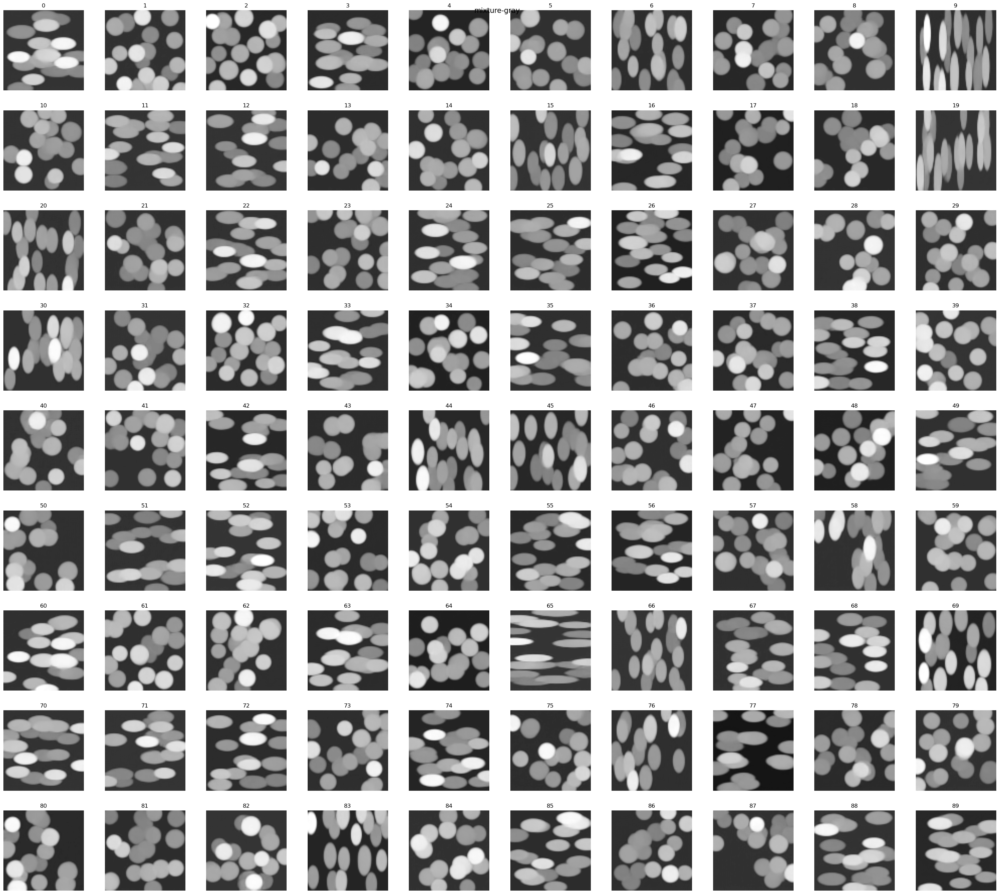

tensor(0.4319, device='cuda:0')


In [12]:
print('fixed_h=', fixed_h, ' sig_L= ',sig_L, ' h0=', h0, ' beta=',beta, ' seed=', seed, ' group=', group)
show_im_set(all_samples[group], n_columns=10, label=group, vmin=0, vmax = 1)

print(all_samples[group].mean())

In [13]:
ids_cond = [0,1,2,3,4]


In [18]:

fixed_h = True
sig_L=.1
h0=.01
beta=.1
###################
n_samples =5
group = 'conditional-gray'

shift = 0
seed = None
freq =100
all_samples = {}
all_interm_Ys = {}
all_init = []


im_n = 0
for id in ids_cond: 
    if 'color' in group.split('-'):
        phi = get_channel_means(denoisers[group], train_sets[id][0:100], device, average_phi=True, with_params=False)
        n_channels=3        
    else: 
        phi = get_channel_means(denoisers[group], train_sets[id][0:100].mean(dim=1, keepdim=True), device, average_phi=True, with_params=False)
        n_channels=1
        
    print('------------ class id : ', id )
    start_time_total = time.time()    
    if seed is not None:
        torch.manual_seed(seed )
    if 'color' in group.split('-'):
        init_im = dist_mean.to(device) +torch.randn(n_samples,n_channels,K,K, device = device).to(device)
    else: 
        init_im = dist_mean.mean(dim=0, keepdim=True).to(device)  +torch.randn(n_samples,n_channels,K,K, device = device).to(device)
        
    sample, interm_Ys,_, _ = batch_conditional_synthesis(denoisers[group], 
                                                            x_c = phi, 
                                                            average_phi=False ,
                                                            init_im =init_im,
                                                            sig_0=1, 
                                                            sig_L=sig_L, 
                                                            h0=h0 , 
                                                            beta=beta , 
                                                            freq=freq,
                                                            device=device, 
                                                            fixed_h = fixed_h,
                                                            max_T=10000, 
                                                            seed=seed, 
                                                            output_size=(n_samples,n_channels,K,K))

    print("--- %s seconds ---" % (time.time() - start_time_total))
        
    all_samples[id] = sample.detach()
    all_interm_Ys[id] = interm_Ys


------------ class id :  0
----------------------------- 100
sigma  0.8882781863212585
mean  0.4589005410671234
----------------------------- 200
sigma  0.7969374060630798
mean  0.45188087224960327
----------------------------- 300
sigma  0.7144055366516113
mean  0.4522685110569
----------------------------- 400
sigma  0.639413058757782
mean  0.4541630446910858
----------------------------- 500
sigma  0.573476254940033
mean  0.45518258213996887
----------------------------- 600
sigma  0.5112268328666687
mean  0.4564815163612366
----------------------------- 700
sigma  0.4622618854045868
mean  0.4522243142127991
----------------------------- 800
sigma  0.4121561050415039
mean  0.4534781873226166
----------------------------- 900
sigma  0.3652753531932831
mean  0.4555944800376892
----------------------------- 1000
sigma  0.3255403935909271
mean  0.4559212028980255
----------------------------- 1100
sigma  0.29109376668930054
mean  0.4573333263397217
----------------------------- 1200
sig

fixed_h: True  , sig_L: 0.1  , h0: 0.01  , beta: 0.1 , seed: None
conditional-gray


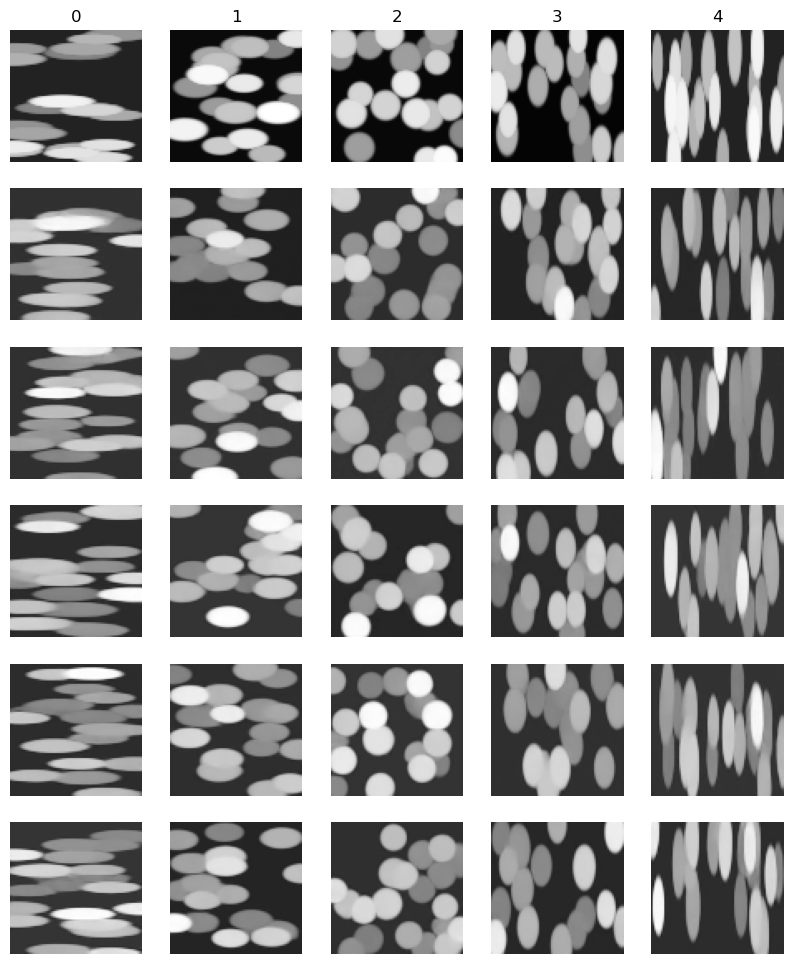

In [19]:
f, axs = plt.subplots( n_samples + 1 , len(ids_cond), figsize=(2*(len(ids_cond) ), 2*(n_samples+1)) )

for i in range(n_samples+1):
    for j in range(len(ids_cond)):
        axs[i,j].axis('off')
   
for i in range(len(ids_cond)): 
    for n in range(n_samples): 
        fig = axs[n+1, i].imshow(np.clip(all_samples[ids_cond[i]][n].permute(1,2,0).squeeze().cpu(), 0,1), 'gray', vmin=0, vmax=1)


for i in range(len(ids_cond)): 
    if 'color' in group.split('-'):
        fig = axs[0, i].imshow(train_sets[i][1].permute(1,2,0).squeeze().cpu(), 'gray')
    else: 
        fig = axs[0, i].imshow(train_sets[i][1].permute(1,2,0).mean(dim=-1, keepdim=True).cpu(), 'gray', vmin=0, vmax=1)
        
    axs[0,i].set_title(ids_cond[i])


print('fixed_h:',fixed_h ,' , sig_L:',sig_L ,' , h0:', h0 , ' , beta:', beta , ', seed:' ,seed)
print(group)


In [22]:
cond_ims = []
for aspect_ratio in [.2,.3,.4, .5, 1, 2,3,4, 5]:
    x = generate_ovals_texture(aspect_ratio, num=20, canvas_size=(80, 80), min_area=60, max_area=100, 
                           edge_smoothness=0.1)
    cond_ims.append(x)
cond_ims = torch.stack(cond_ims).unsqueeze(1)
cond_ims.shape


torch.Size([9, 1, 80, 80])

In [29]:

fixed_h = True
sig_L=.1
h0=.01
beta=.1
###################
n_samples =5
group = 'conditional-gray'

shift = 0
seed = None
freq =100
all_samples = {}
all_interm_Ys = {}
all_init = []


im_n = 0
for id in range(len(cond_ims)): 
    if 'color' in group.split('-'):
        phi = get_channel_means(denoisers[group], cond_ims[id:id  +1], device, average_phi=True, with_params=False)
        n_channels=3        
    else: 
        phi = get_channel_means(denoisers[group], cond_ims[id:id + 1].mean(dim=1, keepdim=True), device, average_phi=True, with_params=False)
        n_channels=1
        
    print('------------ class id : ', id )
    start_time_total = time.time()    
    if seed is not None:
        torch.manual_seed(seed )
    if 'color' in group.split('-'):
        init_im = dist_mean.to(device) +torch.randn(n_samples,n_channels,K,K, device = device).to(device)
    else: 
        init_im = dist_mean.mean(dim=0, keepdim=True).to(device)  +torch.randn(n_samples,n_channels,K,K, device = device).to(device)
        
    sample, interm_Ys,_, _ = batch_conditional_synthesis(denoisers[group], 
                                                            x_c = phi, 
                                                            average_phi=False ,
                                                            init_im =init_im,
                                                            sig_0=1, 
                                                            sig_L=sig_L, 
                                                            h0=h0 , 
                                                            beta=beta , 
                                                            freq=freq,
                                                            device=device, 
                                                            fixed_h = fixed_h,
                                                            max_T=10000, 
                                                            seed=seed, 
                                                            output_size=(n_samples,n_channels,K,K))

    print("--- %s seconds ---" % (time.time() - start_time_total))
        
    all_samples[id] = sample.detach()
    all_interm_Ys[id] = interm_Ys


------------ class id :  0
----------------------------- 100
sigma  0.8752372860908508
mean  0.42361611127853394
----------------------------- 200
sigma  0.7850310206413269
mean  0.420543909072876
----------------------------- 300
sigma  0.693229079246521
mean  0.42319196462631226
----------------------------- 400
sigma  0.6191733479499817
mean  0.4280249774456024
----------------------------- 500
sigma  0.5503118634223938
mean  0.42827969789505005
----------------------------- 600
sigma  0.49402427673339844
mean  0.4318307936191559
----------------------------- 700
sigma  0.43848925828933716
mean  0.4331561326980591
----------------------------- 800
sigma  0.39004477858543396
mean  0.4348733425140381
----------------------------- 900
sigma  0.3490370810031891
mean  0.43279480934143066
----------------------------- 1000
sigma  0.31429624557495117
mean  0.4314512610435486
----------------------------- 1100
sigma  0.27953726053237915
mean  0.43336135149002075
----------------------------

fixed_h: True  , sig_L: 0.1  , h0: 0.01  , beta: 0.1 , seed: None
conditional-gray


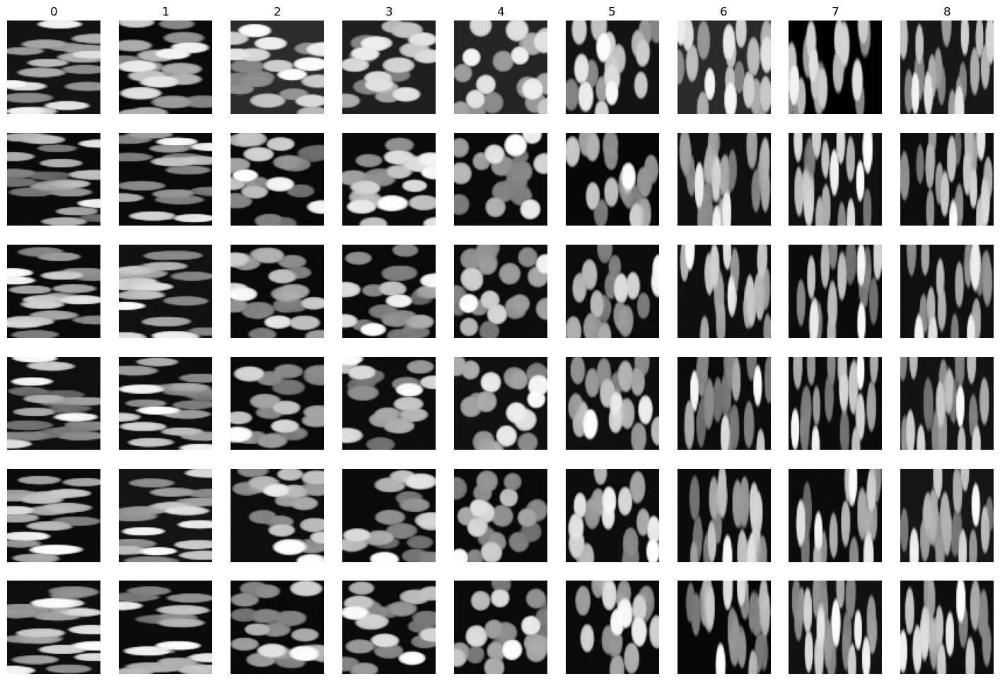

In [32]:
f, axs = plt.subplots( n_samples + 1 , len( all_samples), figsize=(2*(len( all_samples) ), 2*(n_samples+1)) )

for i in range(n_samples+1):
    for j in range(len( all_samples )):
        axs[i,j].axis('off')
   
for i in range(len(cond_ims) ): 
    for n in range(n_samples): 
        fig = axs[n+1, i].imshow(np.clip(all_samples[i][n].permute(1,2,0).squeeze().cpu(), 0,1), 'gray')


for i in range(len(cond_ims)): 
    if 'color' in group.split('-'):
        fig = axs[0, i].imshow(cond_ims[i].permute(1,2,0).squeeze().cpu(), 'gray')
    else: 
        fig = axs[0, i].imshow(cond_ims[i].permute(1,2,0).mean(dim=-1, keepdim=True).cpu(), 'gray', vmin=0, vmax=1)
        
    axs[0,i].set_title(i)


print('fixed_h:',fixed_h ,' , sig_L:',sig_L ,' , h0:', h0 , ' , beta:', beta , ', seed:' ,seed)
print(group)


In [33]:
def initialize_network(network_name, args):
    '''
    Function to dynamically initialize a neural network by class name
    '''
    if network_name in globals() and issubclass(globals()[network_name], nn.Module):
        return globals()[network_name](args)
    else:
        raise ValueError(f"Network {network_name} not found or not a subclass of nn.Module")

        
def load_learned_model(folder_path, print_args=False): 
    '''
    Loads dictionary of all args used to define the model for training and then loads the saved trained model with the specified parameters.
    This can only be used if the network parameters were saved in advanced.
    '''
    with (open(folder_path +'exp_arguments.pkl' , "rb")) as openfile:
        arguments = pickle.load(openfile)    
    
    if print_args: 
        print('*************** saved arguments:*************')
        for key,v in arguments.items(): 
            print(key, v)
    parser = argparse.ArgumentParser(description='set CNN args')

    for k,v in arguments.items(): 
        parser.add_argument('--' + k, default=v)
    args = parser.parse_args('')
    
    args.arch_name = 'UNet_conditional_mean_matching'
    model = initialize_network(args.arch_name, args)
    if torch.cuda.is_available():
        model = model.cuda()
        
    model = read_trained_params(model, folder_path + '/model.pt')
    print('******************************************************')
    print('number of parameters is ' , sum(p.numel() for p in model.parameters() if p.requires_grad))

    model.eval()
    print('train mode:', model.training )
    return model      


##################################################################################################
def read_trained_params(model, path): 
    '''reads parametres of saved models into an initialized network'''
    if torch.cuda.is_available():
        learned_params =torch.load(path, weights_only=True)
    else:
        learned_params =torch.load(path, map_location='cpu' , weights_only=True)
        
    ## unwrap if in Dataparallel 
    new_state_dict = {}
    for key,value in learned_params.items(): 
        if key.split('.')[0] == 'module': 
            new_key = '.'.join(key.split('.')[1::])
            new_state_dict[new_key] = value

        else: 
            new_state_dict[key] = value
        

    model.load_state_dict(new_state_dict, strict=False)        
    model.eval();

    return model




In [43]:

group = 'mixture-modified-gray'

path = root_path + 'UNet_flex/ovals_texture/0to255_RF_84x84_set_size_250000_80x80/'

print('loading group ' , group )
denoisers[group] = load_learned_model(path, print_args=True)


loading group  mixture-modified-gray
*************** saved arguments:*************
arch_name UNet_flex
lr 0.001
batch_size 512
num_epochs 1000
lr_freq 100
loss_weight False
noise_level_range [0, 255]
quadratic_noise True
rescale False
swap False
set_size 250000
imagenet_subset_ids None
self_cond False
data_name ovals_texture
data_root_path /mnt/home/zkadkhodaie/ceph/datasets/
dir_name /mnt/home/zkadkhodaie/ceph/21_hierarchical_conditional_prior/denoisers/UNet_flex/ovals_texture/0to255_RF_84x84_set_size_250000_80x80
optional_dir_label None
device cuda
debug False
kernel_size 3
padding 1
skip True
num_channels 1
bias True
RF 84
coarse True
num_kernels [16, 32, 64, 128]
num_blocks 3
num_enc_conv [2, 2, 2]
num_mid_conv 3
num_dec_conv [2, 2, 2]
NormType LayerNorm
match_only_mid True
nonlinear_enc True
******************************************************
number of parameters is  628273
train mode: False


In [48]:
denoisers['mixture-modified-gray'].match_only_mid = False

In [44]:
def batch_conditional_synthesis(model, 
                          x_c , 
                          average_phi=False,
                          init_im=None, 
                          sig_0=1, 
                          sig_L=.01, 
                          h0=.01, 
                          beta=.01, 
                          freq=0,
                          device=None, 
                          fixed_h = False,
                          max_T=None, 
                          seed=None, 
                          output_size=None):
    
    '''
    @x_c: conditioning image of size (B,C,H,W). It could also be a list of tensors of pre-computed phi_c
    @average_phi: if True, the network uses phi_c computed from a batch of images (or pre-saved from batch of images)
    @init_im: if not None, synthesis starts from init_im rather than white noise. Size=(B,C, H,W)
    @sig_0: initial sigma (largest)
    @sig_L: final sigma (smallest)
    @h0: 1st step size
    @beta:controls added noise in each iteration (0,1]. if 1, no noise is added. As it decreases more noise added.
    @output_size: if None, same as x_c. Else, size of the generated images: (B', C, H', W'). Should match init_im size. 
    '''

    ## Set B, C, H, W from inputs
    if output_size is not None: 
        B, C, H, W = output_size
    else:  
        if init_im is not None:
            B, C, H,W = init_im.size()
        else: 
            if type(x_c) != list:
                B, C, H,W = x_c.size()
            else: 
                raise TypeError('Output dimensions is not provided')
    
    ## ambient dimensionality                 
    N = C*H*W 
    
    ## set the seed
    if seed is not None: 
        torch.manual_seed(seed)

    ## initialize the init image 
    if init_im is not None:
        y = init_im 
    else: 
        e = torch.zeros((B,C ,H,W), requires_grad= False , device=device)
        y = torch.normal(e, sig_0).to(device)
    y.requires_grad = False

    ## lists to collect stuff 
    intermed_Ys=[]
    sigmas = []
    means = []
    
    if freq > 0:
        intermed_Ys.append(y)

    t=1
    sigma = torch.ones(B)*sig_0
    start_time_total = time.time()
    x_c = torch.vstack([x_c]*B )
    update_mask = torch.ones((B,1,1,1), device=device)
    while sigma.max() > sig_L :  
        
        h = h0
        
        if fixed_h is False:
            h = h0*t/(1+ (h0*(t-1)) )


        x_c_noisy = x_c+ torch.randn(size = x_c.size() , device = device) * sigma.reshape((B, 1,1,1)).to(device)
        # x_c_noisy = x_c+ torch.randn(size = x_c.size() , device = device) * torch.ones((B, 1,1,1)).to(device)*.2
        
        with torch.no_grad():
            f_y = model(y, x_c_noisy, average_phi)             
 
                
        
        sigma = torch.norm(f_y, dim=(2,3),keepdim=True).norm(dim=1,keepdim=True)/np.sqrt(N)
        
        sigmas.append(sigma)
        
        gamma = sigma*np.sqrt(((1 - (beta*h))**2 - (1-h)**2 ))
        noise = torch.randn(B,C, H, W, device=device) 
        update_mask[sigma<sig_L] = 0 
        if freq > 0 and t%freq== 0:
            print('-----------------------------', t)
            print('sigma ' , sigma.mean().item() )
            print('mean ', y.mean().item() )
            intermed_Ys.append(y* update_mask- f_y)
            
        y = y -  (h*f_y + gamma*noise ) * update_mask
        means.append(y.mean(dim=(2,3)) )
        # snr = 20*torch.log10((y.std()/sigma)).item()        
        
        
        t +=1
        if max_T is not None and t>max_T:
            print('max T surpassed')
            break
        if sigma.max() > 2:
            print('not converging')
            break
    print('-------- total number of iterations: ', t)
    print("-------- final sigma, " , sigma.mean().item() )
    print('-------- final mean ', y.mean(dim=(2,3)).mean().item() )
    print("-------- final snr, " , 20*torch.log10((y.std()/sigma)).mean().item() )



    denoised_y = y - model(y,x_c_noisy, average_phi)    
        


    return denoised_y, intermed_Ys, sigmas, means

In [51]:
cond_ims = []
for aspect_ratio in [.2,.3,.4, .5, 1, 2,3,4, 5]:
    x = generate_ovals_texture(aspect_ratio, num=20, canvas_size=(80, 80), min_area=60, max_area=100, 
                           edge_smoothness=0.1)
    cond_ims.append(x)
cond_ims = torch.stack(cond_ims).unsqueeze(1)
cond_ims.shape

torch.Size([9, 1, 80, 80])

In [52]:
n_samples = 9

average_phi = False
fixed_h = True
sig_L=.1
h0=.05
beta=.05
# group = 'C'
seed = 0
freq =100
all_samples = {}
all_init = {}


for i in range(len(cond_ims)):
    print('---------- ', i)
    x_c = cond_ims[i:i+1]

    if seed is not None: 
        torch.manual_seed(seed)
    init_im = dist_mean.to(device) +torch.randn(n_samples,n_channels,K,K, device = device).to(device)
    sample, interm_Ys,sigmas, _ = batch_conditional_synthesis(denoisers['mixture-modified-gray'], 
                                                            x_c = x_c.to(device), 
                                                            average_phi=average_phi ,
                                                            init_im =init_im,
                                                            sig_0=1, 
                                                            sig_L=sig_L, 
                                                            h0=h0 , 
                                                            beta=beta , 
                                                            freq=freq,
                                                            device=device, 
                                                            fixed_h = fixed_h,
                                                            max_T=10000, 
                                                            seed=seed, 
                                                            output_size=(n_samples,n_channels,K,K))
    
    all_samples[i] = sample.detach()


----------  0
----------------------------- 100
sigma  0.7572272419929504
mean  0.43980085849761963
----------------------------- 200
sigma  0.5690363645553589
mean  0.44653844833374023
----------------------------- 300
sigma  0.42223626375198364
mean  0.4405742287635803
----------------------------- 400
sigma  0.3025267422199249
mean  0.4434325695037842
----------------------------- 500
sigma  0.21736247837543488
mean  0.442883163690567
----------------------------- 600
sigma  0.15834350883960724
mean  0.4406803548336029
----------------------------- 700
sigma  0.10913114994764328
mean  0.4404747188091278
-------- total number of iterations:  750
-------- final sigma,  0.0995010957121849
-------- final mean  0.4410589635372162
-------- final snr,  9.722386598587036
----------  1
----------------------------- 100
sigma  0.7529294490814209
mean  0.42209404706954956
----------------------------- 200
sigma  0.5559842586517334
mean  0.42718321084976196
----------------------------- 300
sig

average_phi:  False fixed_h:  True sig_L 0.1 h0:  0.05 beta:  0.05 seed:  0


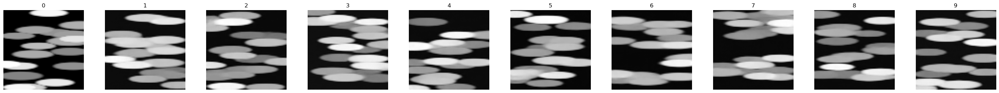

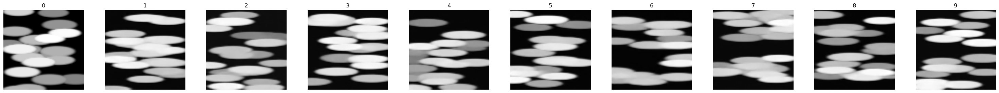

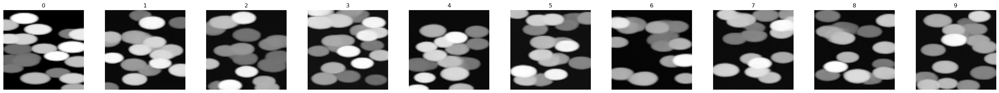

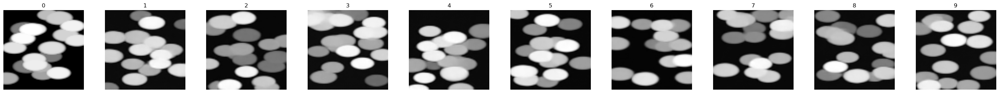

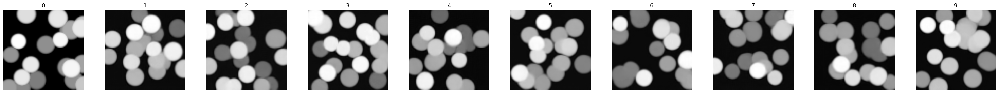

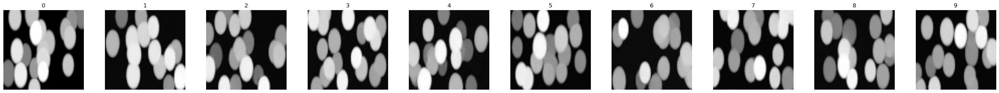

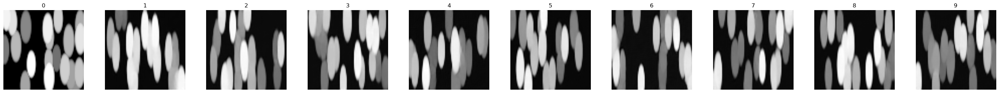

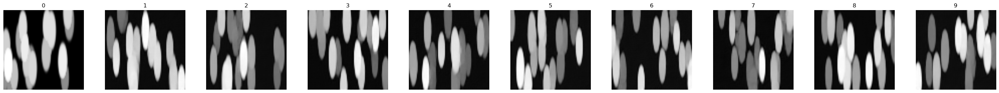

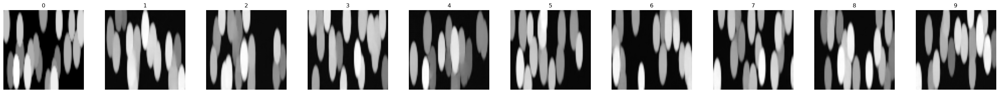

In [47]:
print( 'average_phi: ', average_phi , 'fixed_h: ',fixed_h, 'sig_L' ,sig_L,  'h0: ', h0 ,'beta: ' ,beta, 'seed: ', seed  )
for i in range(len(all_samples)):
    show_im_set(torch.concatenate([cond_ims.cpu()[i:i+1],all_samples[i].detach().cpu()]), 
                n_columns=10)

average_phi:  False fixed_h:  True sig_L 0.1 h0:  0.05 beta:  0.05 seed:  0


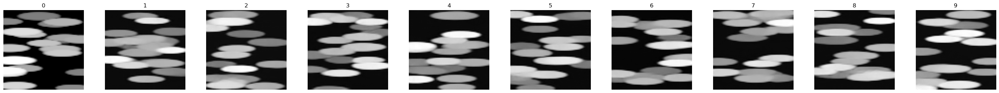

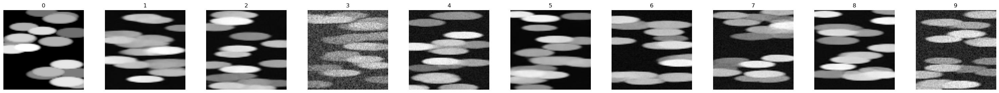

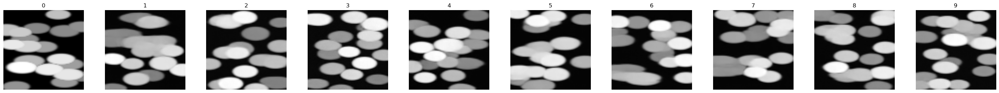

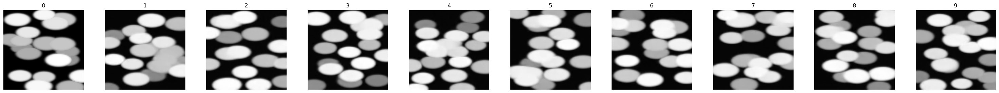

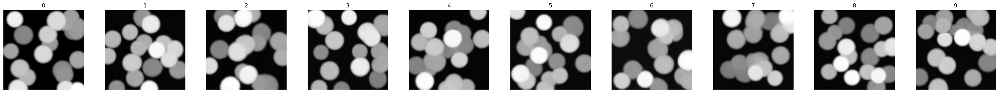

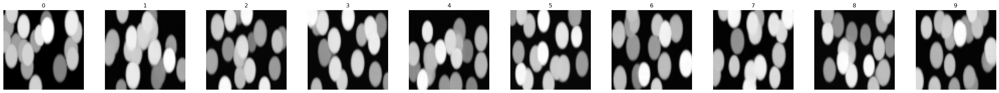

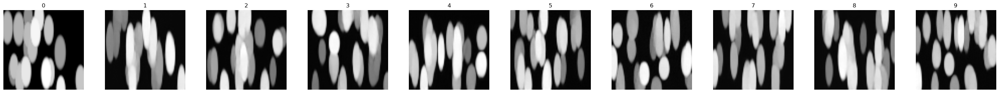

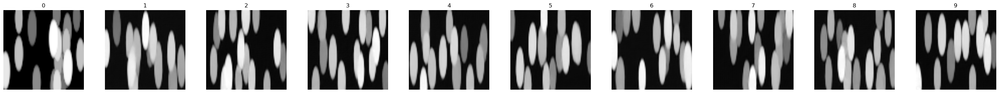

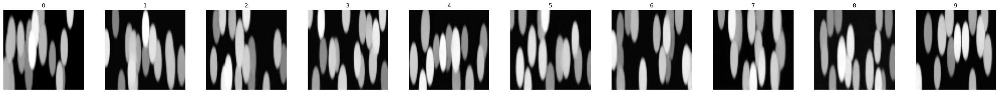

In [53]:
print( 'average_phi: ', average_phi , 'fixed_h: ',fixed_h, 'sig_L' ,sig_L,  'h0: ', h0 ,'beta: ' ,beta, 'seed: ', seed  )
for i in range(len(all_samples)):
    show_im_set(torch.concatenate([cond_ims.cpu()[i:i+1],all_samples[i].detach().cpu()]), 
                n_columns=10)

In [ ]:
[.2,.3,.4, .5, 1, 2,3,4, 5]